The data is taken from http://insideairbnb.com/get-the-data/. Now I consider only Paris, will get to other cities later.

The geo maps can be downloaded from https://www.diva-gis.org/

Coordinates systems for specific regions can be found at https://epsg.io/

In [1]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

import locale
locale.setlocale(locale.LC_ALL, '')

'LC_CTYPE=en_US.UTF-8;LC_NUMERIC=ru_RU.UTF-8;LC_TIME=ru_RU.UTF-8;LC_COLLATE=en_US.UTF-8;LC_MONETARY=ru_RU.UTF-8;LC_MESSAGES=en_US.UTF-8;LC_PAPER=ru_RU.UTF-8;LC_NAME=ru_RU.UTF-8;LC_ADDRESS=ru_RU.UTF-8;LC_TELEPHONE=ru_RU.UTF-8;LC_MEASUREMENT=ru_RU.UTF-8;LC_IDENTIFICATION=ru_RU.UTF-8'

In [2]:
df = pd.read_csv('data/listings.csv')
df.last_scraped = pd.to_datetime(df.last_scraped, infer_datetime_format=True)
df.host_since = pd.to_datetime(df.host_since, infer_datetime_format=True)
df.price = df.price.apply(lambda x: locale.atof(x[1:].replace(',', '')))
df.host_response_rate = df.host_response_rate.apply(lambda x: locale.atof(x[:-1].replace(',', '')) if not pd.isna(x) else x)
df.host_acceptance_rate = df.host_acceptance_rate.apply(lambda x: locale.atof(x[:-1].replace(',', '')) if not pd.isna(x) else x)
df

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,5396,https://www.airbnb.com/rooms/5396,20221210143007,2022-12-11,city scrape,Explore the heart of old Paris,"Cozy, well-appointed and graciously designed s...","You are within walking distance to the Louvre,...",https://a0.muscache.com/pictures/52413/f9bf76f...,7903,...,4.82,4.95,4.55,7510402838018,f,1,1,0,0,1.98
1,7397,https://www.airbnb.com/rooms/7397,20221210143007,2022-12-11,city scrape,MARAIS - 2ROOMS APT - 2/4 PEOPLE,"VERY CONVENIENT, WITH THE BEST LOCATION !<br /...",NaN,https://a0.muscache.com/pictures/67928287/330b...,2626,...,4.88,4.93,4.72,7510400829623,f,2,2,0,0,2.26
2,7964,https://www.airbnb.com/rooms/7964,20221210143007,2022-12-11,previous scrape,Large & sunny flat with balcony !,Very large & nice apartment all for you! <br /...,NaN,https://a0.muscache.com/pictures/4471349/6fb3d...,22155,...,5.00,5.00,5.00,7510903576564,f,1,1,0,0,0.04
3,9359,https://www.airbnb.com/rooms/9359,20221210143007,2022-12-11,city scrape,"Cozy, Central Paris: WALK or VELIB EVERYWHERE !",Location! Location! Location! Just bring your ...,NaN,https://a0.muscache.com/pictures/c2965945-061f...,28422,...,NaN,NaN,NaN,"Available with a mobility lease only (""bail mo...",f,1,1,0,0,NaN
4,81870,https://www.airbnb.com/rooms/81870,20221210143007,2022-12-11,previous scrape,Saint Germain Musee d'orsay,<b>The space</b><br />This beautiful apartment...,NaN,https://a0.muscache.com/pictures/558458/3c1263...,152242,...,5.00,5.00,4.00,NaN,f,78,78,0,0,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55099,777293887700658247,https://www.airbnb.com/rooms/777293887700658247,20221210143007,2022-12-11,city scrape,Aborigine,The flat is decorated in a pure and design way...,Very quiet area.<br />Four times a week there ...,https://a0.muscache.com/pictures/miso/Hosting-...,490045822,...,NaN,NaN,NaN,7511107644867,f,1,1,0,0,NaN
55100,778194850167838333,https://www.airbnb.com/rooms/778194850167838333,20221210143007,2022-12-11,city scrape,Gratte-ciel - bien située - proche Tour Eiffel,"In the heart of the 15th arrondissement, this ...",The 15th arrondissement is a pleasant and very...,https://a0.muscache.com/pictures/prohost-api/H...,490713158,...,NaN,NaN,NaN,7511507662375,f,1,1,0,0,NaN
55101,778209219542952721,https://www.airbnb.com/rooms/778209219542952721,20221210143007,2022-12-11,city scrape,Charming apartment 2 P - Malesherbe,This pretty studio specially designed for love...,This studio is located in the 8th arrondisseme...,https://a0.muscache.com/pictures/prohost-api/H...,374553401,...,NaN,NaN,NaN,7510807648613,f,91,91,0,0,NaN
55102,777311545564408798,https://www.airbnb.com/rooms/777311545564408798,20221210143007,2022-12-10,city scrape,Appartement Guisarde,Profitez d'un logement élégant et central. Le ...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,325898345,...,NaN,NaN,NaN,7510807670783,f,4,4,0,0,NaN


The scraping process seems to have taken 3 days. Ok.

In [3]:
df.last_scraped.unique()

array(['2022-12-11T00:00:00.000000000', '2022-12-12T00:00:00.000000000',
       '2022-12-10T00:00:00.000000000'], dtype='datetime64[ns]')

Only one listing doesn't have a picture. So in general I can count on the presence of picture.

In [4]:
df.picture_url.isna().sum()

1

Some hosts may have several listings.

In [5]:
df.groupby('host_id').size()[df.groupby('host_id').size() > 1]

host_id
2626         2
6792         9
31300        2
33995        6
37107        4
            ..
489949873    2
490067255    2
490101524    3
490447621    2
490707417    3
Length: 3425, dtype: int64

There are 22 columns with info about host. 
These columns contain:

* Telling whether the host is near the place they give to rent
* Some info the host gives about him/herself
* The name shouldn't tell anything about client satisfaction. But if there are inappropriate/unrelevant names, there can be a connection to amount of bookings. 
* Host since. Can check whether there is a connection between amount of bookings/reviews and host's 'experience'.
* Responce time. Not sure about that, may find something accidentally.
* Responce time/rate, acceptance rate. Can check whether there is a connection between amount of bookings/reviews and host's 'willingness to answer'.
* I need to read about what is 'superhost'.
* Hosts have pictures. Maybe some info about their ethnicity/age/looks/gender/etc... can have a connection to other values? 
* Some hosts have a huge amount of listings. Why is that?
* Info about host's verification/presence of profile pic/indetification can be helpful to analize their perceived trustworthiness. 
* Info about the property of a host (last 4 columns) can tell about 'bigness' of a host. I suppose, there are usual people who give their spare property, and there are people who make business out of it; and there may be a difference between these two types of people.

In [6]:
host_columns = df.filter(regex='host_*').columns
display(host_columns)
host_columns.size

Index(['host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'],
      dtype='object')

22

In [7]:
df.host_about[0]

"The flat is owned by journalists who spend a lot of time traveling for work who understand what people need when they're away from home. Guillaume and his partners manage arrivals and checkins.. We all love Paris and try to make it easy for people to come and visit the city. "

In [8]:
df.iloc[:, 25:]

,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,t,t,"Paris, Ile-de-France, France",Hôtel-de-Ville,NaN,48.852470,2.358350,Entire rental unit,Entire home/apt,2,...,4.82,4.95,4.55,7510402838018,f,1,1,0,0,1.98
1,t,t,NaN,Hôtel-de-Ville,NaN,48.859090,2.353150,Entire rental unit,Entire home/apt,4,...,4.88,4.93,4.72,7510400829623,f,2,2,0,0,2.26
2,t,t,NaN,Opéra,NaN,48.874170,2.342450,Entire rental unit,Entire home/apt,2,...,5.00,5.00,5.00,7510903576564,f,1,1,0,0,0.04
3,t,t,NaN,Louvre,NaN,48.860060,2.348630,Entire rental unit,Entire home/apt,1,...,NaN,NaN,NaN,"Available with a mobility lease only (""bail mo...",f,1,1,0,0,NaN
4,t,t,NaN,Luxembourg,NaN,48.855580,2.331190,Entire rental unit,Entire home/apt,2,...,5.00,5.00,4.00,NaN,f,78,78,0,0,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55099,t,t,"Paris, Île-de-France, France",Popincourt,NaN,48.859871,2.370187,Entire rental unit,Entire home/apt,4,...,NaN,NaN,NaN,7511107644867,f,1,1,0,0,NaN
55100,t,t,"Paris, Île-de-France, France",Vaugirard,NaN,48.851021,2.287371,Entire rental unit,Entire home/apt,6,...,NaN,NaN,NaN,7511507662375,f,1,1,0,0,NaN
55101,t,f,"Paris, Île-de-France, France",Batignolles-Monceau,NaN,48.881870,2.317000,Entire rental unit,Entire home/apt,2,...,NaN,NaN,NaN,7510807648613,f,91,91,0,0,NaN
55102,t,t,NaN,Luxembourg,NaN,48.851777,2.333944,Entire rental unit,Entire home/apt,2,...,NaN,NaN,NaN,7510807670783,f,4,4,0,0,NaN


In [9]:
other_cols = list(set(df.columns).difference(host_columns))
df[other_cols]

,number_of_reviews,maximum_maximum_nights,name,neighbourhood_group_cleansed,bathrooms_text,maximum_nights_avg_ntm,review_scores_value,first_review,description,neighbourhood_cleansed,...,room_type,availability_90,neighbourhood,calendar_last_scraped,review_scores_cleanliness,scrape_id,number_of_reviews_ltm,review_scores_rating,minimum_maximum_nights,maximum_nights
0,324,1125.0,Explore the heart of old Paris,NaN,1 bath,1125.0,4.55,2009-06-30,"Cozy, well-appointed and graciously designed s...",Hôtel-de-Ville,...,Entire home/apt,14,"Paris, Ile-de-France, France",2022-12-11,4.51,20221210143007,49,4.55,1125.0,1125
1,321,130.0,MARAIS - 2ROOMS APT - 2/4 PEOPLE,NaN,1 bath,130.0,4.72,2011-04-08,"VERY CONVENIENT, WITH THE BEST LOCATION !<br /...",Hôtel-de-Ville,...,Entire home/apt,27,NaN,2022-12-11,4.43,20221210143007,33,4.72,130.0,130
2,6,365.0,Large & sunny flat with balcony !,NaN,1 bath,365.0,5.00,2010-05-10,Very large & nice apartment all for you! <br /...,Opéra,...,Entire home/apt,0,NaN,2022-12-11,5.00,20221210143007,0,4.80,365.0,365
3,0,360.0,"Cozy, Central Paris: WALK or VELIB EVERYWHERE !",NaN,1 bath,360.0,NaN,NaN,Location! Location! Location! Just bring your ...,Louvre,...,Entire home/apt,0,NaN,2022-12-11,NaN,20221210143007,0,NaN,360.0,360
4,1,365.0,Saint Germain Musee d'orsay,NaN,1 bath,365.0,4.00,2012-01-07,<b>The space</b><br />This beautiful apartment...,Luxembourg,...,Entire home/apt,0,NaN,2022-12-11,5.00,20221210143007,0,5.00,365.0,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55099,0,365.0,Aborigine,NaN,2 baths,365.0,NaN,NaN,The flat is decorated in a pure and design way...,Popincourt,...,Entire home/apt,10,"Paris, Île-de-France, France",2022-12-11,NaN,20221210143007,0,NaN,365.0,365
55100,0,365.0,Gratte-ciel - bien située - proche Tour Eiffel,NaN,1 bath,365.0,NaN,NaN,"In the heart of the 15th arrondissement, this ...",Vaugirard,...,Entire home/apt,71,"Paris, Île-de-France, France",2022-12-11,NaN,20221210143007,0,NaN,365.0,365
55101,0,1125.0,Charming apartment 2 P - Malesherbe,NaN,1 bath,1125.0,NaN,NaN,This pretty studio specially designed for love...,Batignolles-Monceau,...,Entire home/apt,87,"Paris, Île-de-France, France",2022-12-11,NaN,20221210143007,0,NaN,1125.0,1125
55102,0,365.0,Appartement Guisarde,NaN,1 bath,365.0,NaN,NaN,Profitez d'un logement élégant et central. Le ...,Luxembourg,...,Entire home/apt,89,NaN,2022-12-10,NaN,20221210143007,0,NaN,365.0,365


# Geographical data

In [10]:
geo_cols = ['latitude', 'longitude', 'neighbourhood_group_cleansed', 'neighbourhood_cleansed', 'neighbourhood']
other_cols = list(set(other_cols).difference(geo_cols))


The neighbourhoods are written in different ways, so some standartization will be required.

In [11]:
df[geo_cols]['neighbourhood'].unique()

array(['Paris, Ile-de-France, France', nan,
       'Paris, Île-de-France, France',
       'Paris 11e Arrondissement, Île-de-France, France', 'Paris, France',
       'Paris-13E-Arrondissement, Île-de-France, France',
       'Paris 4e arrondissement, Île-de-France, France',
       'Paris, IDF, France', 'Paris 5e, France',
       'Paris, Ile de France, France', 'Paris, IdF, France',
       'Paris 18e, France', 'Bagnolet, Île-de-France, France',
       'Boulogne-Billancourt, Île-de-France, France',
       'Paris, Pigalle, France', 'Paris 01, Île-de-France, France',
       'Paris 2e, France', 'Paris, Paris province, France',
       'PARIS 3eme, Île-de-France, France',
       ' Deuil-la-Barre , Île-de-France, France',
       'vanves, Île-de-France, France',
       'Le Pré-Saint-Gervais, Île-de-France, France',
       'París, Île-de-France, France', 'PARIS 02, Île-de-France, France',
       'Paris 10e, France',
       'Paris-10E-Arrondissement, Île-de-France, France', 'France',
       'Bagnol

'neighbourhood_group_cleansed' contains only NaN values. Can throw it away.

In [12]:
df[geo_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55104 entries, 0 to 55103
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   latitude                      55104 non-null  float64
 1   longitude                     55104 non-null  float64
 2   neighbourhood_group_cleansed  0 non-null      float64
 3   neighbourhood_cleansed        55104 non-null  object 
 4   neighbourhood                 31682 non-null  object 
dtypes: float64(3), object(2)
memory usage: 2.1+ MB


In [13]:
df[geo_cols]

,latitude,longitude,neighbourhood_group_cleansed,neighbourhood_cleansed,neighbourhood
0,48.852470,2.358350,NaN,Hôtel-de-Ville,"Paris, Ile-de-France, France"
1,48.859090,2.353150,NaN,Hôtel-de-Ville,NaN
2,48.874170,2.342450,NaN,Opéra,NaN
3,48.860060,2.348630,NaN,Louvre,NaN
4,48.855580,2.331190,NaN,Luxembourg,NaN
...,...,...,...,...,...
55099,48.859871,2.370187,NaN,Popincourt,"Paris, Île-de-France, France"
55100,48.851021,2.287371,NaN,Vaugirard,"Paris, Île-de-France, France"
55101,48.881870,2.317000,NaN,Batignolles-Monceau,"Paris, Île-de-France, France"
55102,48.851777,2.333944,NaN,Luxembourg,NaN


Latitude and Longitude can be helpful in visualizations!

# Price
let's convert price to a floating point number

In [16]:
df.price.describe()

count    55104.000000
mean       165.590736
std        548.364248
min          0.000000
25%         70.000000
50%        107.000000
75%        176.000000
max      99140.000000
Name: price, dtype: float64

As may be expected, the price is higher in proximity to the center.

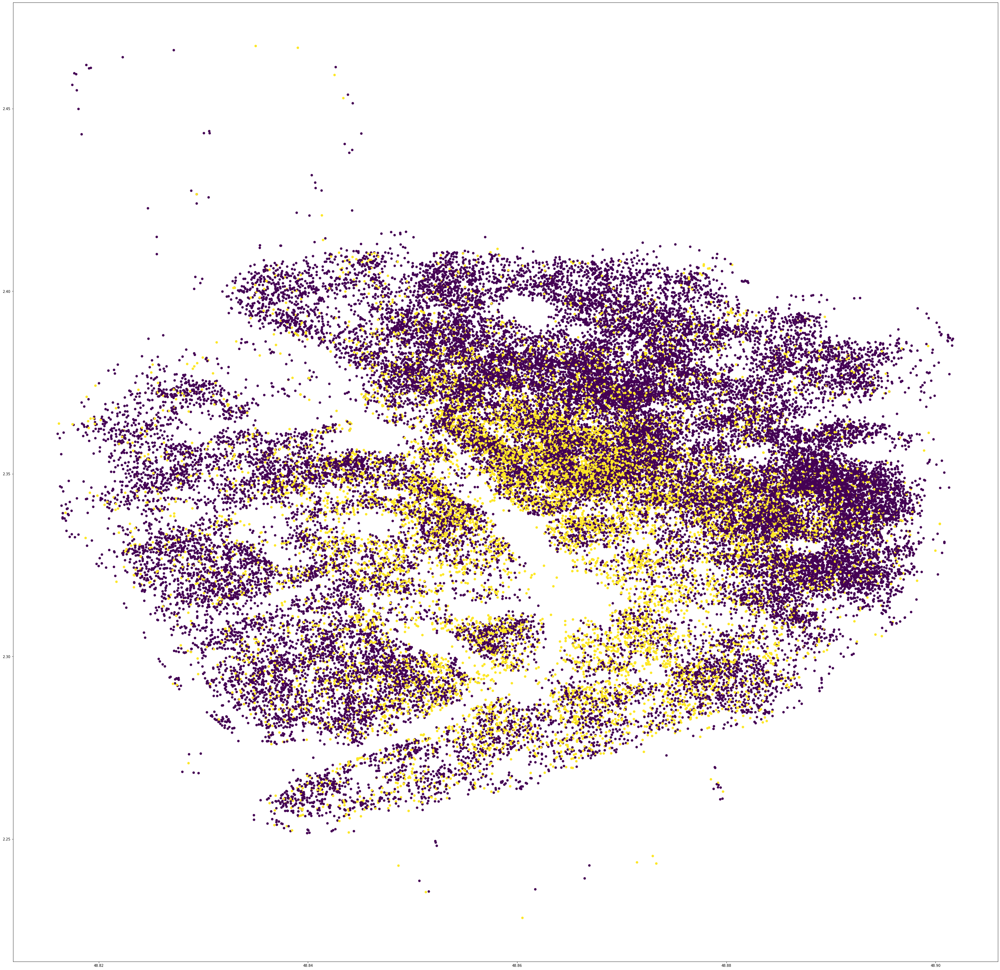

In [17]:
cond = df.price > 176
plt.figure(figsize=(50,50))
plt.scatter(x=df.latitude, y=df.longitude, c=cond)
plt.show()

# Review scores

In [18]:
review_score_cols = df.filter(regex='^review_scores').columns
other_cols = list(set(other_cols).difference(review_score_cols))

df[review_score_cols]

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,4.55,4.58,4.51,4.79,4.82,4.95,4.55
1,4.72,4.80,4.43,4.91,4.88,4.93,4.72
2,4.80,5.00,5.00,5.00,5.00,5.00,5.00
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.00,5.00,5.00,5.00,5.00,5.00,4.00
...,...,...,...,...,...,...,...
55099,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55101,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55102,NaN,NaN,NaN,NaN,NaN,NaN,NaN


~20% of rows do not contain info about reviews. It may be interesting to see why.

In [19]:
df[review_score_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55104 entries, 0 to 55103
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   review_scores_rating         44576 non-null  float64
 1   review_scores_accuracy       44043 non-null  float64
 2   review_scores_cleanliness    44047 non-null  float64
 3   review_scores_checkin        44034 non-null  float64
 4   review_scores_communication  44044 non-null  float64
 5   review_scores_location       44032 non-null  float64
 6   review_scores_value          44030 non-null  float64
dtypes: float64(7)
memory usage: 2.9 MB


There is a little asymmetry in mean values of each column with rows grouped by presentce of reviews. 
For example, there is a difference in host_response_rate and host_acceptance_rate. The availability also looks the same, so there are two options:

* Either some people book this places and never write a review.
* Or no-one books these places because the host blocks them. So there is noone to write a review.

In [20]:
pp = df.groupby(by=df[review_score_cols].isna().all(axis=1))
px.imshow((pp.mean(numeric_only=True) / df.max(axis=0, numeric_only=True))).show()

Almost all review scores are >4, which is pretty high. It may be interesting to look into those <4.

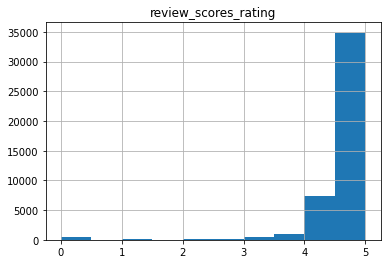

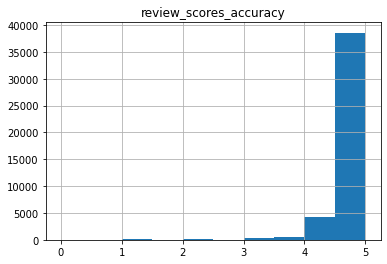

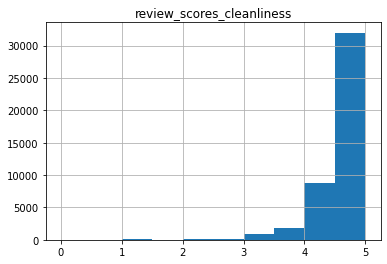

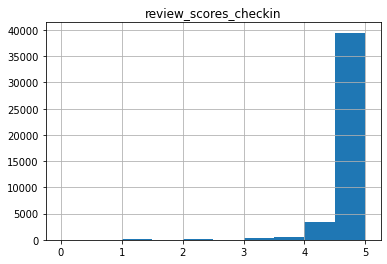

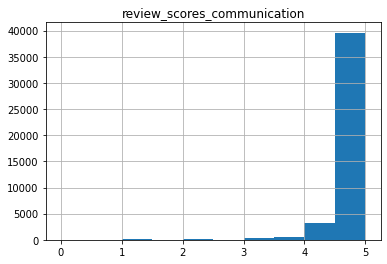

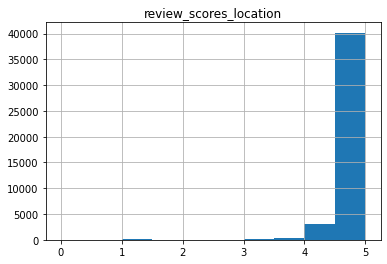

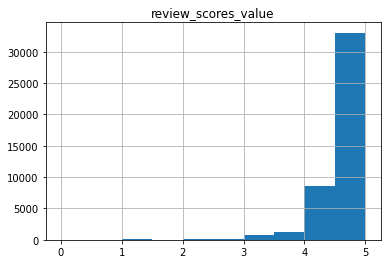

In [21]:
for col in review_score_cols:
    df[col].hist()
    plt.title(col)
    plt.show()

Listring with every review score <4 seem to more available days. Which means that less people wants to book them.

So I see a direct impact of reviews on user interest in a listing.

In [22]:
pp = df.groupby(by=(df[review_score_cols] < 4).all(axis=1))
px.imshow((pp.mean(numeric_only=True) / df.max(axis=0, numeric_only=True))).show()

There is a correlation between review score for location and a district in a city (obviously). More info can be extracted from reviews.

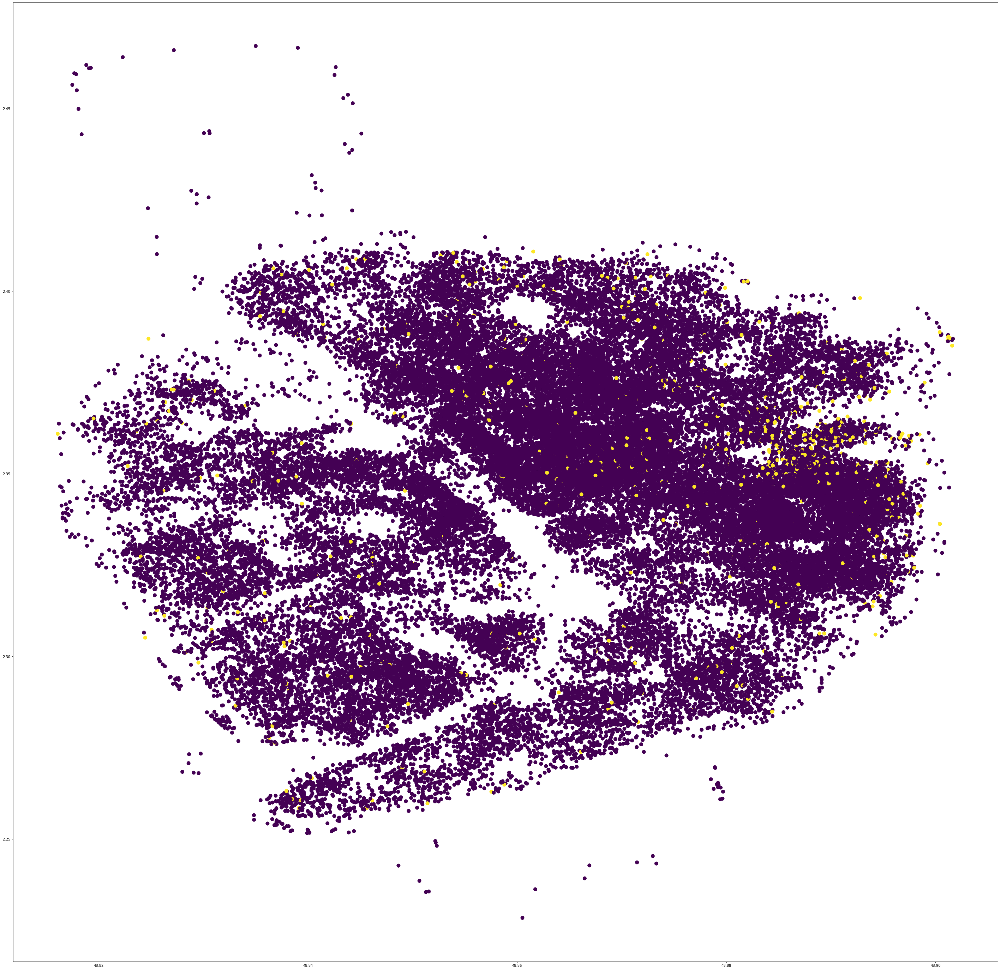

In [23]:
cond = df.review_scores_location < 4
plt.figure(figsize=(50,50))
plt.scatter(x=df.latitude, y=df.longitude, c=cond, s=100)
plt.show()

In [24]:
reviews_df = pd.read_csv('data/reviews.csv')

In [25]:
reviews_df

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,5396,4824,2009-06-30,19995,Sarah,Perfect location!! Nasrine was a delight and m...
1,5396,4968,2009-07-03,20117,Chris,This is a nice place in a great location in Pa...
2,5396,5240,2009-07-08,22190,Annelaure,"Nice studio, very clean, very quiet, in a grea..."
3,5396,9619,2009-09-10,11947,Jean,"Superb location, great studio. \r<br/>A slice ..."
4,5396,18970,2009-12-02,40625,Bette,"Perfect place to be in Paris, walking home eve..."
...,...,...,...,...,...,...
1344656,773256843125033946,778070546983532360,2022-12-09,121878672,Geoffrey,Great location to stay at in Paris
1344657,773855006284722902,776635630686179224,2022-12-07,102380017,Jeanne,"Apparemment bien situé, pratique !"
1344658,773855006284722902,777387223983952216,2022-12-08,22388279,Alexandre,Très pro
1344659,773941206050817766,776616740398257581,2022-12-07,125303748,Assadi,"Un logement sympa, agréable et accessible. Pas..."


a) It seems that if people hated the place, they will put 1 to everything. For example, below are the reviews with scores for location equal to 1, but they don't mention the location in they comment.
b) For some reason, when a client puts a low score on location (compared to other features), they don't mention why in the comment.

So at least for location, I cannot make any reliable inference based on comments. However, I've looked only through some of reviews, so there may be some connection in general. In any case, the priority of this task is lowered.

In [26]:
# Id's with review_scores_location == 1.0
for j in [767472825170394728, 764451431324912283, 757010759066648817]:
    for i in reviews_df[reviews_df.listing_id == j].comments:
        print(i)
        print('-' * 50)
        
print('#' * 50)
# location < 3 but some other scores are > 4
for j in [8402227, 6398506]:
    for i in reviews_df[reviews_df.listing_id == j].comments:
        print(i)
        print('-' * 50)
        

Eilfried et un ANARQUE<br/>l'adresse n'est pas la même que celle indiquée dans les instructions. Eilfried m'a fait attendre toute la journée, sous prétexte que l'entrée ne pouvait se faire avant 20h parce que j'avais besoin de temps pour faire le ménage. Après quelques minutes pour atteindre l'appartement, En entrant, je suis confronté à un environnement sale. Et avec lui me disant que la chambre était prête, et dans l'annonce il était clairement indiqué qu'il s'agissait d'un appartement entier. Voir l'appartement sale, avec une énorme odeur de nourriture, vaisselle faite au-dessus de l'évier, le salon en désordre. en tenant compte du fait que l'appartement n'avait qu'une seule chambre, ce qui en disant que ce serait l'endroit où ma copine et moi aurions loué. Où dormirait-il ? dans le salon? Je n'ai jamais eu une telle frustration que celle ci… c'est inadmissible qu'airbnb accepte une telle chose. Et pour couronner le tout, je ne voulais pas me rembourser obtenir une valeur de 636€
--

In [27]:
df[(df.review_scores_location < 3) & (df.review_scores_accuracy > 4) & (df.review_scores_checkin > 4)]


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
5138,6004199,https://www.airbnb.com/rooms/6004199,20221210143007,2022-12-11,previous scrape,APARTMENT NEAR SACRE COEUR,"hello,<br /><br />I put my rent lounge with so...",animated and lively but also very quiet montma...,https://a0.muscache.com/pictures/74880256/f139...,31169495,...,4.60,2.90,3.90,NaN,f,1,1,0,0,0.15
5646,6398506,https://www.airbnb.com/rooms/6398506,20221210143007,2022-12-11,previous scrape,Paris Montmartre Sacré Coeur,Appartement 1er étage proche de la butte Montm...,NaN,https://a0.muscache.com/pictures/80159210/31bd...,6629222,...,4.43,2.71,4.00,NaN,f,1,1,0,0,0.10
8297,8402227,https://www.airbnb.com/rooms/8402227,20221210143007,2022-12-11,city scrape,Deux chambres dans maison & verdure,"Le 1er étage d'une maison entourée de verdure,...",La maison se situe au carrefour des quartiers ...,https://a0.muscache.com/pictures/110199705/0c6...,43767152,...,5.00,0.00,5.00,7512002318033,f,3,1,2,0,0.01
9796,10483485,https://www.airbnb.com/rooms/10483485,20221210143007,2022-12-11,previous scrape,ALL FLAT (NOT A SHARE) Paris,"It's a simple, quiet flat in the middle of Par...",NaN,https://a0.muscache.com/pictures/7fa40de2-e223...,54037705,...,5.00,0.00,5.00,NaN,f,1,1,0,0,0.01
22639,26845078,https://www.airbnb.com/rooms/26845078,20221210143007,2022-12-11,previous scrape,Agréable 2 pièces dans le centre de Paris,"Bel appartement au 1er étage, proche tout comm...",NaN,https://a0.muscache.com/pictures/c33a2a00-74df...,201885557,...,4.57,2.71,3.57,NaN,f,1,1,0,0,0.15
24387,29872297,https://www.airbnb.com/rooms/29872297,20221210143007,2022-12-11,city scrape,Charming room for 2/3 - 5 min from Canal St-Ma...,For your next trip to Paris we would like to o...,We are really well situated in the heart of th...,https://a0.muscache.com/pictures/2761309c-e9c6...,192420468,...,5.00,1.00,5.00,NaN,t,7,0,0,0,0.10
26871,34088529,https://www.airbnb.com/rooms/34088529,20221210143007,2022-12-10,city scrape,Appartement Moderne à La Porte de la Villette,"A une dizaine de mètres de Paris, et à moins d...",NaN,https://a0.muscache.com/pictures/0c391c29-a617...,100341058,...,5.00,2.00,5.00,NaN,f,1,1,0,0,0.02
29557,37173042,https://www.airbnb.com/rooms/37173042,20221210143007,2022-12-11,previous scrape,Appartement charmant dans quartier central,Mon appartement est un 2 pieces parisien. Parq...,Le quartier est multiculturel.,https://a0.muscache.com/pictures/f64339fb-8b86...,107935178,...,5.00,2.75,4.75,7511802539209,f,1,1,0,0,0.10
39523,51420248,https://www.airbnb.com/rooms/51420248,20221210143007,2022-12-12,previous scrape,Joli appartement traditionnel parisien,"Appartement 2 pièces 37m2 en très bon état, si...",Quartier traditionnel parisien très vivant. Co...,https://a0.muscache.com/pictures/2a0f22eb-84fc...,143101204,...,5.00,2.00,3.00,NaN,f,1,1,0,0,0.06
44799,621487219528285842,https://www.airbnb.com/rooms/621487219528285842,20221210143007,2022-12-12,previous scrape,"Lovely flat for 2, 10 mins from Montmartre",My flat is located in the 18th arrondissement ...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,38429281,...,5.00,2.50,4.50,7511806529570,f,1,1,0,0,0.31


In [28]:
france_gdf = gpd.read_file('fra/FRA_adm3.shp')
france_gdf.crs = 'epsg:4807'
france_gdf.plot()

paris_gdf = france_gdf[france_gdf.NAME_2 == 'Paris']
paris_gdf.plot()

ImportError: the 'read_file' function requires the 'fiona' package, but it is not installed or does not import correctly.
Importing fiona resulted in: libtiff.so.5: cannot open shared object file: No such file or directory

In [ ]:
points = df.apply(lambda row: Point(row.longitude, row.latitude), axis=1).tolist()

In [ ]:
gdf = gpd.GeoDataFrame(df, geometry=points)
# Specific coordinate system for France
gdf.crs = 'epsg:4807'
ax = france_gdf[france_gdf.NAME_2 == 'Paris'].plot(figsize=(20,20), 
                                                   color='lightgrey', 
                                                   edgecolor='black', 
                                                   linewidth=10,
                                                   alpha=0.1)
ax.axis('off')

ax = gdf.plot(ax=ax, markersize=2, figsize=(20,20), c=gdf.review_scores_location < 4, alpha=0.5)
ax.axis('off')


# About "professional" hosts

In [ ]:
pp = df.groupby('host_id').size().sort_values(ascending=False)
plt.hist(pp[pp > 300])
plt.show()


In [ ]:
cond = df.host_id.isin(pp[pp > 5].index)
plt.figure(figsize=(50,50))
plt.scatter(x=df.latitude, y=df.longitude, c=cond, s=100)
plt.show()

In [ ]:
fraq_listings = df[cond].shape[0] / df.shape[0] * 100
fraq_hosts = df[cond].host_id.unique().shape[0] / df.host_id.unique().shape[0] * 100
print("{:.2f}% of all listings belong to {:.2f}% hosts".format(fraq_listings, fraq_hosts))